In [108]:
import cv2
import numpy as np
from skimage import color
from matplotlib import pyplot as plt
from skimage.morphology import erosion, dilation
from skimage.filters import gaussian, median, sobel
plt.rcParams['figure.figsize'] = [15, 10]

(<matplotlib.image.AxesImage at 0x1764c39ca70>, (-0.5, 643.5, 361.5, -0.5))

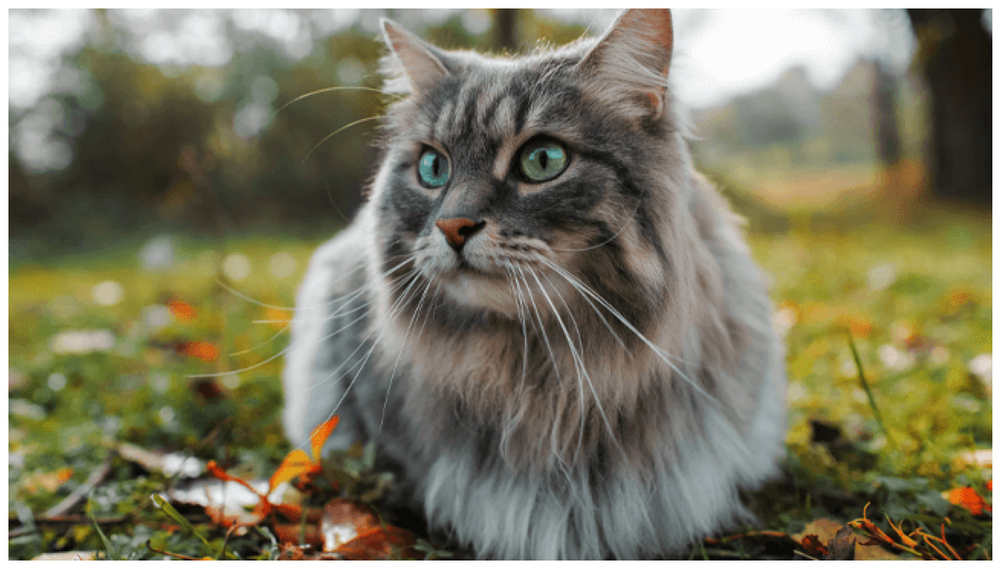

In [109]:
img = cv2.imread('../cat.webp')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img), plt.axis('off')

## A

(<matplotlib.image.AxesImage at 0x1764c3bca40>, (-0.5, 643.5, 361.5, -0.5))

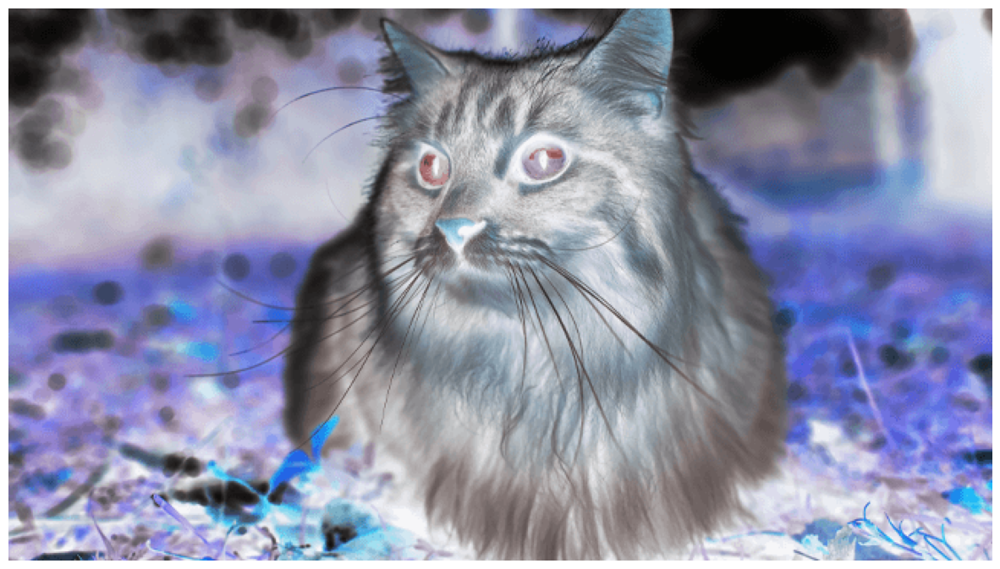

In [110]:
inverted = 255 - img
plt.imshow(inverted), plt.axis('off')

## B

(<Axes: >,
 (-0.5, 643.5, 361.5, -0.5))

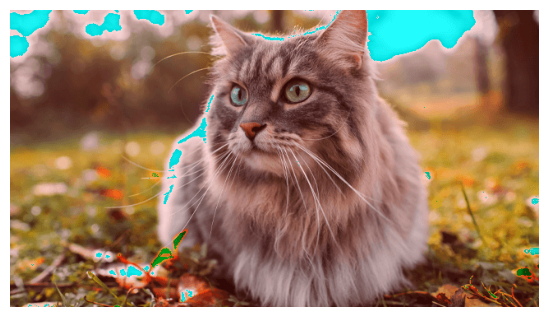

In [111]:
value = 39
new = img.copy()
new[:, :, 0] = np.clip(new[:, :, 0] + value, 0, 255)
plt.subplot(121), plt.imshow(new.astype('uint8')), plt.axis('off')

## C

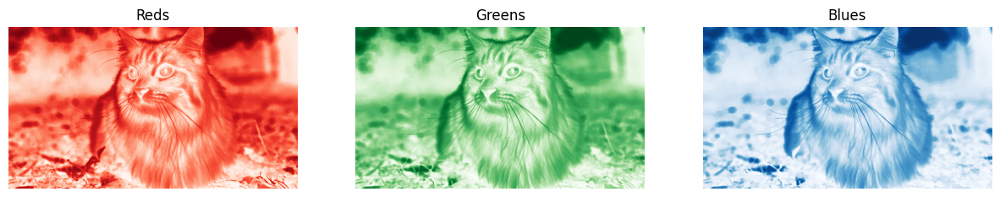

In [112]:
param = {'rgb': [img[:,:,0], img[:,:,1], img[:,:,2]],
         'cmap': ['Reds', 'Greens', 'Blues']}
fig, axes = plt.subplots(1, 3, figsize=(15, 10))

for i in range(3):
    axes[i].imshow(param['rgb'][i], cmap=param['cmap'][i])
    axes[i].set_title(param['cmap'][i])
    axes[i].axis('off')

## D

(<Axes: >,
 (-0.5, 643.5, 361.5, -0.5))

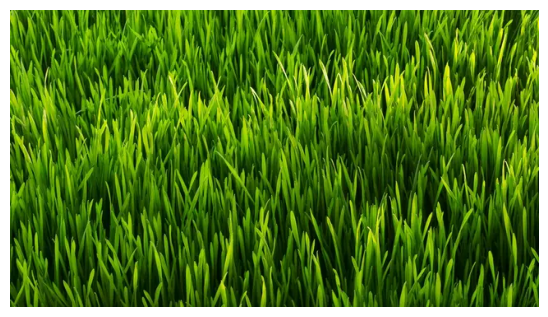

In [113]:
img2 = cv2.imread('../grass.webp')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
plt.subplot(122), plt.imshow(img2), plt.axis('off')

(<Axes: >,
 (-0.5, 643.5, 361.5, -0.5))

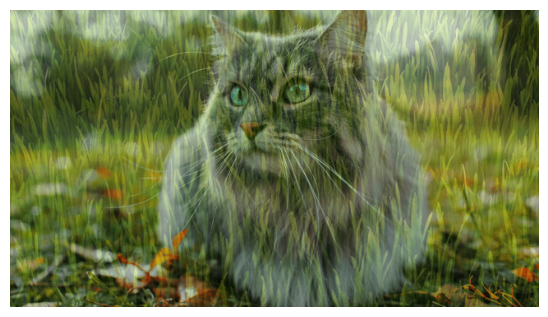

In [114]:
alpha = 0.7  
merged = alpha * img + (1 - alpha) * img2

plt.subplot(122), plt.imshow(np.clip(merged, 0, 255).astype(np.uint8)), plt.axis('off')

## E

In [115]:
blurred = gaussian(img, sigma=3, channel_axis=-1)
sharpening_kernel = np.array([[-1, -1, -1],
                              [-1,  9, -1],
                              [-1, -1, -1]])
sharpened = cv2.filter2D(img, -1, sharpening_kernel)
median_fil = median(img)
eroded = erosion(img)
dilated = dilation(img)
sobel_fil = sobel(color.rgb2gray(img))

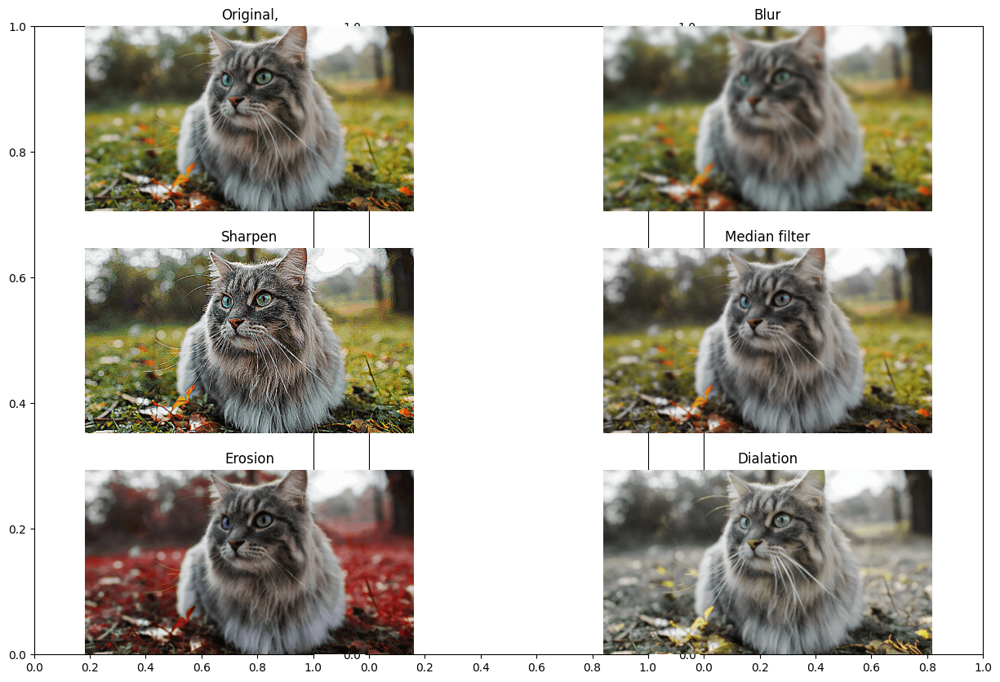

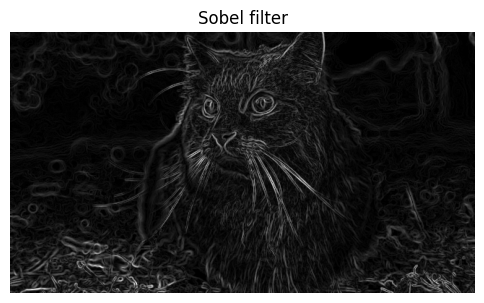

In [116]:
param = {'image': [img, blurred, sharpened, median_fil, eroded, dilated, sobel_fil],
         'title': ['Original,', 'Blur', 'Sharpen', 'Median filter', 'Erosion', 'Dialation']}
fig, axes = plt.subplots(1, 3, figsize=(15, 10))

for i in range(1, 7):
    plt.subplot(3, 2, i)
    plt.title(param['title'][i-1])
    plt.imshow(param['image'][i-1])
    plt.axis('off')
else:
    plt.figure(figsize=(6, 6))
    plt.title('Sobel filter')
    plt.imshow(sobel_fil, cmap='gray')
    plt.axis('off')

## F

(<matplotlib.image.AxesImage at 0x176482cce00>, (-0.5, 359.5, 359.5, -0.5))

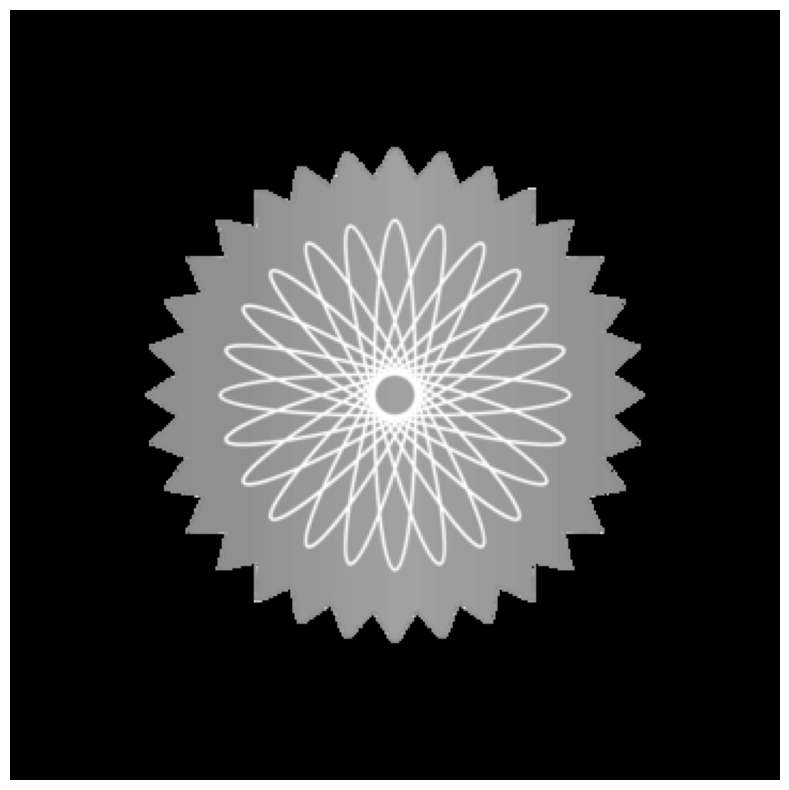

In [117]:
watermark = cv2.imread('../Watermark.png')
watermark = cv2.cvtColor(watermark, cv2.COLOR_BGR2GRAY)
plt.imshow(watermark, cmap='gray'), plt.axis('off')

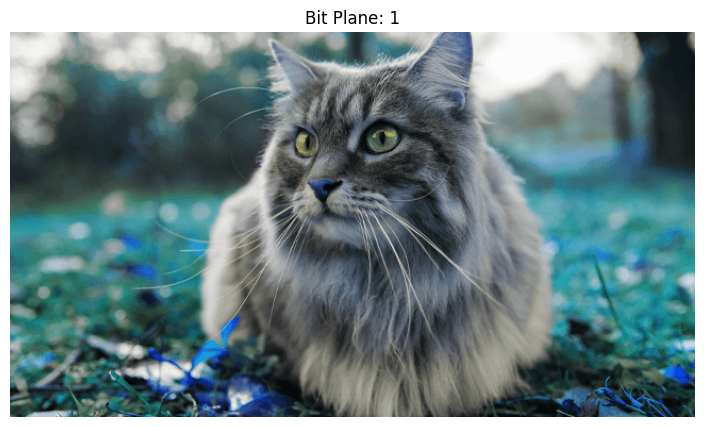

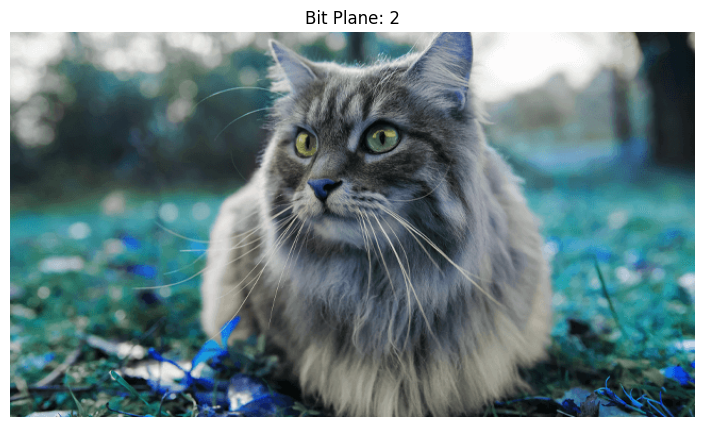

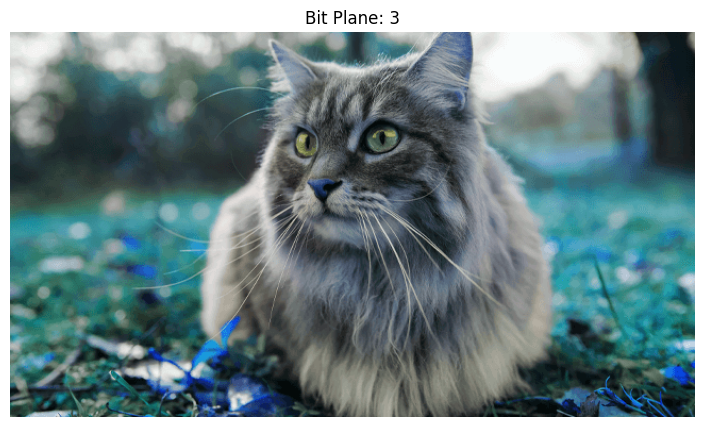

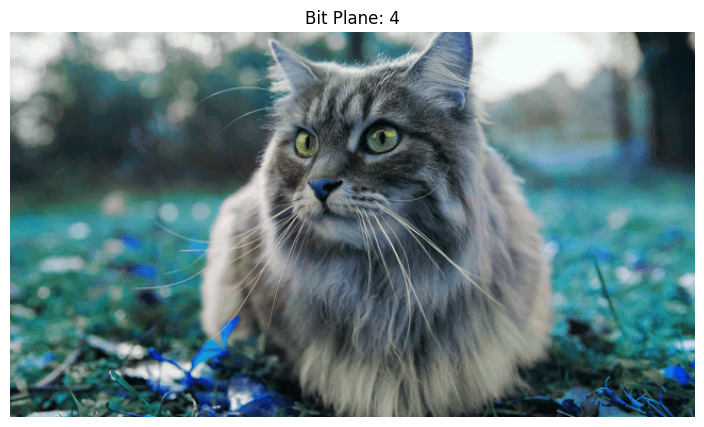

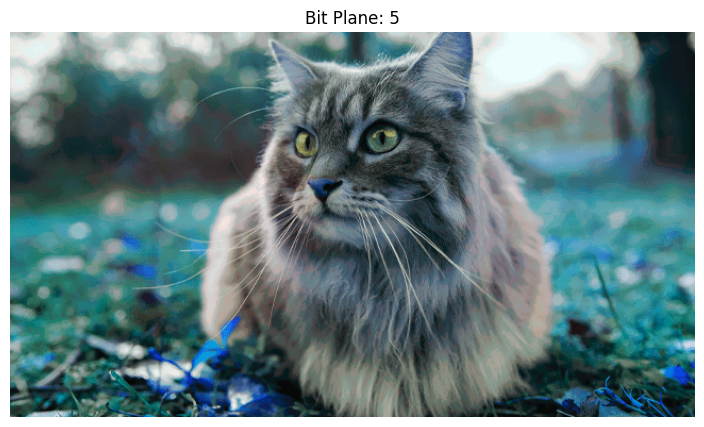

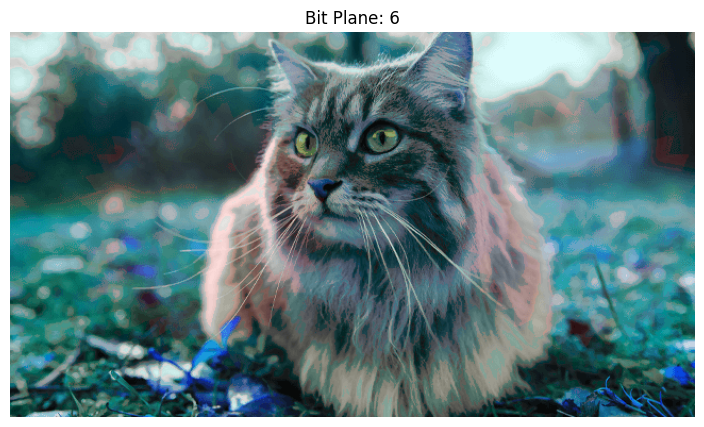

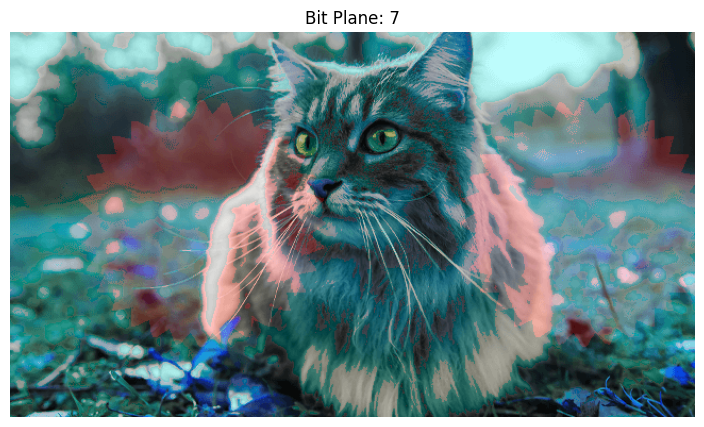

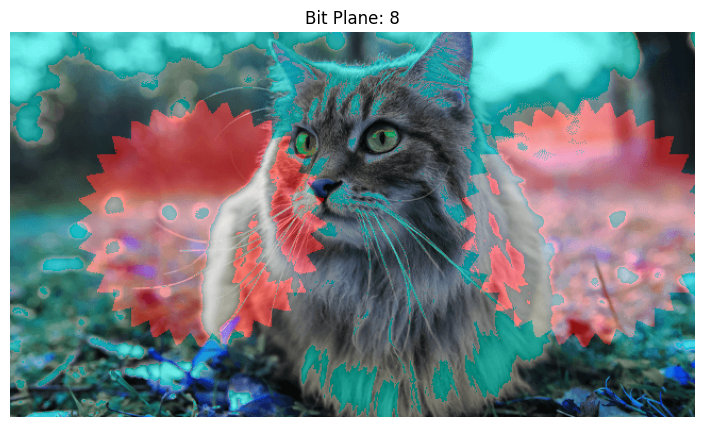

In [119]:
def embed_watermark(img, watermark, bit_plane):
    image = img.copy()

    wm_rows = int(np.ceil(image.shape[0] / watermark.shape[0]))
    wm_cols = int(np.ceil(image.shape[1] / watermark.shape[1]))
    wm = np.tile(watermark, (wm_rows, wm_cols))[:image.shape[0], :image.shape[1]]

    blue_channel = image[:, :, 2].copy()
    mask = 1 << (bit_plane - 1)

    blue_channel &= (255 - mask)
    watermark_bin = (wm > 128).astype(np.uint8)
    blue_channel |= watermark_bin * mask

    image[:, :, 2] = blue_channel
    return image

for bit_plane in range(1, 9):
    result= embed_watermark(img, watermark, bit_plane)
    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title(f'Bit Plane: {bit_plane}')
    plt.axis('off')
    plt.show()